# Импортирование необходимых библиотек

In [45]:
from sentinelhub import SHConfig
from sentinelhub import SentinelHubCatalog

import datetime, os, csv, math
from math import ceil
import matplotlib.pyplot as plt
import numpy as np
from shapely.ops import unary_union
from fiona.drvsupport import supported_drivers
import geopandas as gpd
from matplotlib.path import Path
from shapely.geometry import Polygon
import earthpy.spatial as es
import earthpy.plot as ep
import numpy.ma as ma
from scipy.stats.mstats import gmean, hmean
import pandas as pd
import seaborn as sns
from functools import reduce
from matplotlib.colors import LinearSegmentedColormap

from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler, StandardScaler

from sentinelhub import (
    CRS,
    BBox,
    DataCollection,
    DownloadRequest,
    MimeType,
    MosaickingOrder,
    SentinelHubDownloadClient,
    SentinelHubRequest,
    bbox_to_dimensions,
    filter_times
)

# The following is not a package. It is a file utils.py which should be in the same folder as this notebook.
from utils import plot_image

colors = ['tomato', 'navy', 'MediumSpringGreen', 'lightblue', 'orange', 'blue',
          'maroon', 'purple', 'yellow', 'olive', 'brown', 'cyan']

import csv, json, codecs, sys
import urllib.request
import urllib.error
import pandas as pd

import requests
from bs4 import BeautifulSoup

In [2]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
sns.set()

# Подключение к аккаунту Sentinel Hub

In [3]:
CLIENT_ID = os.getenv('CLIENT_ID')
CLIENT_SECRET = os.environ.get('CLIENT_SECRET')

config = SHConfig()

if CLIENT_ID and CLIENT_SECRET:
    config.sh_client_id = CLIENT_ID
    config.sh_client_secret = CLIENT_SECRET

if not config.sh_client_id or not config.sh_client_secret:
    print("Warning! To use Process API, please provide the credentials (OAuth client ID and client secret).")

In [4]:
catalog = SentinelHubCatalog(config=config)
# catalog.get_info()

# Получение координат экспериментального пастбища 

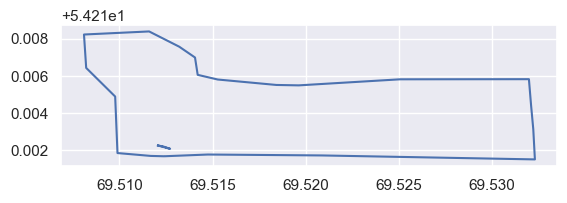

In [5]:
supported_drivers['KML'] = 'rw'
pasture_df = gpd.read_file('pasture.kml', driver='KML')

all_zagons = []
for zagon in range(len(pasture_df.index)):
    all_zagons.append(pasture_df.loc[zagon].geometry)
    
merged_zagons = unary_union(all_zagons)

gpd.GeoSeries([merged_zagons]).boundary.plot()
plt.show()

In [6]:
x_min, y_min, x_max, y_max = merged_zagons.bounds
pasture_coords_wgs84 = (x_min, y_min, x_max, y_max)

# Отправка запросов и получение снимков 

In [7]:
resolution = 10
pasture_bbox = BBox(bbox=pasture_coords_wgs84, crs=CRS.WGS84)
pasture_size = bbox_to_dimensions(pasture_bbox, resolution=resolution)

print(f"Image shape at {resolution} m resolution: {pasture_size} pixels")

Image shape at 10 m resolution: (157, 78) pixels


# Доступные базы данных (Спутиковые базы!!!)

In [8]:
print("Supported DataCollections:\n")
for collection in DataCollection.get_available_collections():
    print(collection)

Supported DataCollections:

DataCollection.SENTINEL2_L1C
DataCollection.SENTINEL2_L2A
DataCollection.SENTINEL1
DataCollection.SENTINEL1_IW
DataCollection.SENTINEL1_IW_ASC
DataCollection.SENTINEL1_IW_DES
DataCollection.SENTINEL1_EW
DataCollection.SENTINEL1_EW_ASC
DataCollection.SENTINEL1_EW_DES
DataCollection.SENTINEL1_EW_SH
DataCollection.SENTINEL1_EW_SH_ASC
DataCollection.SENTINEL1_EW_SH_DES
DataCollection.DEM
DataCollection.DEM_MAPZEN
DataCollection.DEM_COPERNICUS_30
DataCollection.DEM_COPERNICUS_90
DataCollection.MODIS
DataCollection.LANDSAT_MSS_L1
DataCollection.LANDSAT_TM_L1
DataCollection.LANDSAT_TM_L2
DataCollection.LANDSAT_ETM_L1
DataCollection.LANDSAT_ETM_L2
DataCollection.LANDSAT_OT_L1
DataCollection.LANDSAT_OT_L2
DataCollection.SENTINEL5P
DataCollection.SENTINEL3_OLCI
DataCollection.SENTINEL3_SLSTR
DataCollection.HARMONIZED_LANDSAT_SENTINEL


# Выбор одной из доступных баз данных

In [9]:
data_collection = DataCollection.SENTINEL2_L2A
bands_dict = dict([(band.name, i) for i, band in enumerate(data_collection.bands)])
aux_data_dict = dict([(band, i) for i, band in enumerate(["sunZenithAngles","sunAzimuthAngles","viewZenithMean","viewAzimuthMean"])])

# Составление запросов

In [10]:
evalscript_all_bands = """
    //VERSION=3
    function setup() {{
        return {{
            input: [{{
                bands: [{BANDS}],
                units: "DN"
            }}],
            output: {{
                bands: {COUNT},
                sampleType: "FLOAT32"
            }}
        }};
    }}

    function evaluatePixel(sample) {{
        return [{SAMPLE}];
    }}
"""
template1 = ""; template2 = ""
for band in bands_dict.keys(): 
    template1 += f'"{band}", '; 
    template2 += f'sample.{band}, ';
settings = {"BANDS": template1, "SAMPLE": template2, "COUNT": str(len(bands_dict))}
evalscript_all_bands = evalscript_all_bands.format(**settings)

In [11]:
evalscript_aux_data = """
    //VERSION=3

    function setup() {{
        return {{
            input: [{{
                bands: [{BANDS}],
                units: "DEGREES"
            }}],
            output: {{
                bands: {COUNT},
                sampleType: "FLOAT32"
            }}
        }};
    }}

    function evaluatePixel(sample) {{
        return [{SAMPLE}];
    }}
"""
template1 = ""; template2 = ""
for band in aux_data_dict.keys(): 
    template1 += f'"{band}", '; 
    template2 += f'sample.{band}, ';
settings = {"BANDS": template1, "SAMPLE": template2, "COUNT": str(len(aux_data_dict))}
evalscript_aux_data = evalscript_aux_data.format(**settings)

# Снимки на даты (с 1 Мая по 31 Августа 2011-2021 г.)

In [12]:
# Define the initial time interval
start_date = datetime.datetime.strptime("2016-05-01", "%Y-%m-%d")
end_date = datetime.datetime.strptime("2016-08-31", "%Y-%m-%d")

# Define the number of years to increment
years_to_increment = 1  # You can change this value as needed

# Create a loop to change the years
several_years_aux_data = []; several_years_bands_data = []
unique_dates_data = []; header_labels = []

while start_date.year < 2023:  # Change the end condition year as needed
    start_date += datetime.timedelta(days=365 * years_to_increment)
    end_date += datetime.timedelta(days=365 * years_to_increment)
    
    # Convert the updated dates back to string format
    new_start_date_str = start_date.strftime("%Y-%m-%d")
    new_end_date_str = end_date.strftime("%Y-%m-%d")
    
    
    time_interval = new_start_date_str, new_end_date_str
    header_labels.append((new_start_date_str, new_end_date_str))
    
    print(time_interval)
    
    search_iterator = catalog.search(
        data_collection,
        bbox=pasture_bbox,
        time=time_interval,
        filter="eo:cloud_cover <= 100",
        fields={"include": ["id", "properties.datetime", "properties.eo:cloud_cover"], "exclude": []},
    )

    results = list(search_iterator)
    print("Total number of results:", len(results))

    
    ############################################################################################
    time_difference = datetime.timedelta(hours=1)

    all_timestamps = search_iterator.get_timestamps()
    unique_acquisitions = filter_times(all_timestamps, time_difference)
    unique_dates_data.append(unique_acquisitions)
    
    ############################################################################################
    all_bands_process_requests = []

    for timestamp in unique_acquisitions:
        request = SentinelHubRequest(
            evalscript=evalscript_all_bands,
            input_data=[
                SentinelHubRequest.input_data(
                    data_collection=data_collection,
                    time_interval=(timestamp - time_difference, timestamp + time_difference),
                )
            ],
            responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
            bbox=pasture_bbox,
            size=pasture_size,
            config=config,
        )
        all_bands_process_requests.append(request)

    
    ############################################################################################
    aux_data_process_requests = []

    for timestamp in unique_acquisitions:
        request = SentinelHubRequest(
            evalscript=evalscript_aux_data,
            input_data=[
                SentinelHubRequest.input_data(
                    data_collection=data_collection,
                    time_interval=(timestamp - time_difference, timestamp + time_difference),
                )
            ],
            responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
            bbox=pasture_bbox,
            size=pasture_size,
            config=config,
        )
        aux_data_process_requests.append(request)
        
    ############################################################################################

    client = SentinelHubDownloadClient(config=config)
    all_bands_download_requests = [request.download_list[0] for request in all_bands_process_requests]
    all_bands_data = client.download(all_bands_download_requests)
    several_years_bands_data.append(all_bands_data)
    ############################################################################################

    client = SentinelHubDownloadClient(config=config)
    aux_data_download_requests = [request.download_list[0] for request in aux_data_process_requests]
    aux_data = client.download(aux_data_download_requests)
    several_years_aux_data.append(aux_data)

('2017-05-01', '2017-08-31')
Total number of results: 53
('2018-05-01', '2018-08-31')
Total number of results: 74
('2019-05-01', '2019-08-31')
Total number of results: 50
('2020-04-30', '2020-08-30')
Total number of results: 50
('2021-04-30', '2021-08-30')
Total number of results: 50
('2022-04-30', '2022-08-30')
Total number of results: 50
('2023-04-30', '2023-08-30')
Total number of results: 51


# Составление маски пастбища

In [13]:
 aoi_height, aoi_width, _ = several_years_bands_data[-1][-1].shape

In [14]:
masks = []
pasture_edges = []
for zagon in range(len(pasture_df)-1):
    polygon=[]

    for coords in pasture_df.loc[zagon].geometry.exterior.coords:

        x = int(np.interp(coords[0], [x_min, x_max], [0, aoi_width]))
        y = int(np.interp(coords[1], [y_min, y_max], [aoi_height, 0]))

        polygon.append((y, x))
        
    poly_path=Path(polygon)
    x, y = np.mgrid[:aoi_height, :aoi_width]
    coors=np.hstack((x.reshape(-1, 1), y.reshape(-1,1)))
    
    pasture_edges.append(Polygon(polygon))
    
    mask = ~poly_path.contains_points(coors)
    masks.append(mask)
    
combined_mask = reduce(np.logical_and, masks)

# Маска для загона №1 

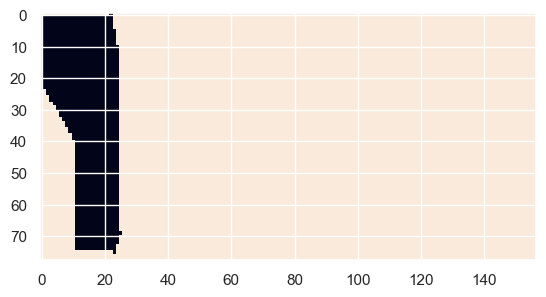

In [15]:
plt.imshow(masks[0].reshape(aoi_height, aoi_width))
plt.show()

# Маска для пастбища

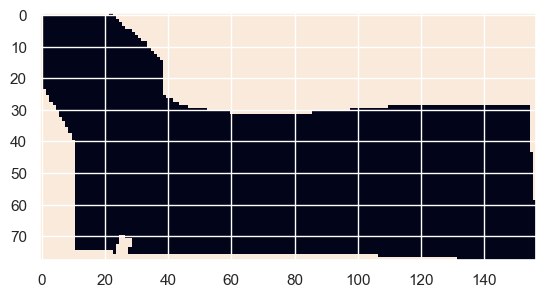

In [16]:
plt.imshow(combined_mask.reshape(aoi_height, aoi_width))
plt.show()

# Объявление вспомогательных функции

In [44]:
def normalize(band):
    band_min, band_max = (band.min(), band.max())
    return ((band - band_min)/((band_max - band_min)))

def brighten(band):
    alpha=0.13
    beta=0
    return np.clip(alpha*band+beta, 0, 255)

def Kcluster(matrix, n_clusters=3):
#     scaler = MinMaxScaler(); matrix = scaler.fit_transform(matrix);
#     scaler = StandardScaler(); matrix = scaler.fit_transform(matrix);

    flattened_matrix = matrix.flatten()

    kmeans = KMeans(n_clusters=n_clusters, random_state=45)
    kmeans.fit(flattened_matrix.reshape(-1, 1))

    cluster_labels = kmeans.labels_
    result_index = cluster_labels.reshape(matrix.shape)
    result_index = ma.masked_array(result_index, mask=combined_mask.reshape(aoi_height, aoi_width))

    return ~(result_index == 0), ~(result_index == 1), ~(result_index == 2) 

def get_only_pasture(index):
    only_pasture = ma.masked_array(ma.masked_array((index), mask=np.isinf((index)) | np.isnan((index))), mask=combined_mask.reshape(aoi_height, aoi_width))
    return only_pasture

def get_only_zagon(index, zagon):
    only_pasture = ma.masked_array(ma.masked_array((index), mask=np.isinf((index)) | np.isnan((index))), mask=masks[zagon-1].reshape(aoi_height, aoi_width))
    return only_pasture

def mean(index):
    return float(index.mean())

def median(index):
    return float(ma.median(index))

def filter_dates_by_year_month(date_list, month, year=None):
    filtered_dates = []

    for date_str in date_list:
        date = datetime.datetime.strptime(date_str, "%Y-%m-%d")
        if (year is None or date.year == year) and date.month == month:
            filtered_dates.append(date_str)

    return filtered_dates

def show_real_pasture():
    
    fig, ax = plt.subplots(figsize=(12, 6))
    for zagon in range(len(pasture_df)-1):
        ax.plot(pasture_edges[zagon].exterior.xy[1], pasture_edges[zagon].exterior.xy[0])
    ep.plot_rgb(np.stack([RED, GREEN, BLUE]), ax=ax, title=general_info, figsize=(12, 6))
    plt.show()    

    
def show_pasture_index(test_meet, lower_bound, upper_bound, show_hists=True, save_excel=False):
    
    fig, ax = plt.subplots(figsize=(12, 12))
    for zagon in range(len(pasture_df)-1):

        ax.plot(pasture_edges[zagon].exterior.xy[1], pasture_edges[zagon].exterior.xy[0])

    header = input_text
    precision = 4
    # print(f"Макс: {round(float(test_meet.max()),precision)} || Мин: {round(float(test_meet.min()),precision)} || Сред: {round(float(test_meet.mean()),precision)} || Сумм: {round(float(test_meet.sum()),precision)}")
    ep.plot_bands(test_meet, title=f"{header} {general_info}", ax=ax, cmap="bwr", cols=1, vmin=lower_bound, vmax=upper_bound, figsize=(10, 14))
    plt.show()

    test_index_masked_array = []
    for i, mask in enumerate(masks):
        mx = ma.masked_array(test_meet, mask=mask.reshape(aoi_height, aoi_width))
        test_index_masked_array.append(mx)

    summary_data = []
    for i, zagon in enumerate(test_index_masked_array):
        summary_data.append([f"№{i+1}", round(zagon.sum(),precision), round(zagon.mean(),precision), round(ma.median(zagon),precision), round(zagon.max(),precision), round(zagon.min(),precision)])


    styles = [
        {'selector': '',
         'props': [('border', '2px solid #000'), ('border-collapse', 'collapse')]},
        {'selector': 'th',
         'props': [('border', '2px solid #000')]},
        {'selector': 'td',
         'props': [('border', '1px solid #000'), ('padding', '5px')]}
    ]

    summary_df = pd.DataFrame(data = summary_data, columns=["Загон", "Сумма", "Cреднаяя", "Медианная", "Макс", "Мин"])
    sum_row = pd.DataFrame({'Загон': ["Пастбище"], 'Сумма': [summary_df['Сумма'].sum()], 'Cреднаяя': [round(float(test_meet.mean()),precision)], 'Медианная': [round(float(ma.median(test_meet)),precision)], 'Макс': [summary_df['Макс'].max()], 'Мин': [summary_df['Мин'].min()]}, index=[len(summary_df.index)])
    summary_df = pd.concat([summary_df, sum_row])
    if save_excel:
        summary_df.to_excel(f"Summary_{date_chosen}_{data_collection.processing_level}.xlsx", index=None)
    styled_df = summary_df.style.set_table_styles(styles)
    styled_df.hide(axis="index")
    
    display(styled_df)

    if show_hists:
        for i, zagon in enumerate(test_index_masked_array):
            ep.hist(zagon, colors = colors[i], title=f'{header} || Загон-{i+1} {general_info}', cols=4, alpha=0.5,
            figsize = (10, 6))    
            plt.axvline(test_index_masked_array[i].mean(), color='b', linestyle='dashed', linewidth=2)
            plt.axvline(ma.median(test_index_masked_array[i]), color='r', linestyle='dashed', linewidth=2)
            has_negative_or_zero = test_index_masked_array[i] <= 0
            if not has_negative_or_zero.sum():
                plt.axvline(hmean(test_index_masked_array[i].reshape(aoi_width * aoi_height)), color='g', linestyle='dashed', linewidth=2)
                plt.axvline(gmean(test_index_masked_array[i].reshape(aoi_width * aoi_height)), color='y', linestyle='dashed', linewidth=2)
                plt.legend([f"Средняя: {test_index_masked_array[i].mean()}",f"Медианная: {ma.median(test_index_masked_array[i])}",f"Гармоническая: {hmean(test_index_masked_array[i].reshape(aoi_width * aoi_height))}",f"Геометрическая: {gmean(test_index_masked_array[i].reshape(aoi_width * aoi_height))}"], title=f'Сумма: {round(zagon.sum(),precision)}')
            else:
                plt.legend([f"Средняя: {ma.mean(test_index_masked_array[i])}",f"Медианная: {ma.median(test_index_masked_array[i])}"], title=f'Сумма: {round(zagon.sum(),precision)}')
        plt.show()
        
        
def get_all_bands(by_pasture=True):
    global ULTRA_BLUE, BLUE, GREEN, RED, RED_EDGE1, RED_EDGE2, RED_EDGE3, NIR, N_NIR, WV, SWIR_C, SWIR2, SWIR3, SAA, SZA, VAM, VZM
    
    if by_pasture:
        # Нормализированные по пастбищу
        ULTRA_BLUE = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B01"]])))

        BLUE = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B02"]])))
        GREEN = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B03"]])))
        RED = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B04"]])))

        RED_EDGE1 = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B05"]])))
        RED_EDGE2 = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B06"]])))
        RED_EDGE3 = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B07"]])))

        NIR = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B08"]])))
        N_NIR = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B8A"]])))
        WV = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B09"]])))
        if "B10" in bands_dict:
            SWIR_C = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B10"]])))
        SWIR2 = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B11"]])))
        SWIR3 = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B12"]])))
    else:
        # НЕ Нормализированные по пастбищу
        ULTRA_BLUE = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B01"]])))

        BLUE = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B02"]])))
        GREEN = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B03"]])))
        RED = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B04"]])))

        RED_EDGE1 = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B05"]])))
        RED_EDGE2 = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B06"]])))
        RED_EDGE3 = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B07"]])))

        NIR = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B08"]])))
        N_NIR = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B8A"]])))
        WV = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B09"]])))
        if "B10" in bands_dict:
            SWIR_C = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B10"]])))
        SWIR2 = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B11"]])))
        SWIR3 = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B12"]])))

    SAA = (aux_data[image_date][:, :, aux_data_dict["sunAzimuthAngles"]]).mean()
    SZA = (aux_data[image_date][:, :, aux_data_dict["sunZenithAngles"]]).mean()
    VAM = (aux_data[image_date][:, :, aux_data_dict["viewAzimuthMean"]]).mean()
    VZM = (aux_data[image_date][:, :, aux_data_dict["viewZenithMean"]]).mean()

# Выбор порога облачности

In [18]:
white_noise_threshold = 255 # Значение [0-255]  
white_noise_count = 12246 # Количество 157*78=[0-12246]

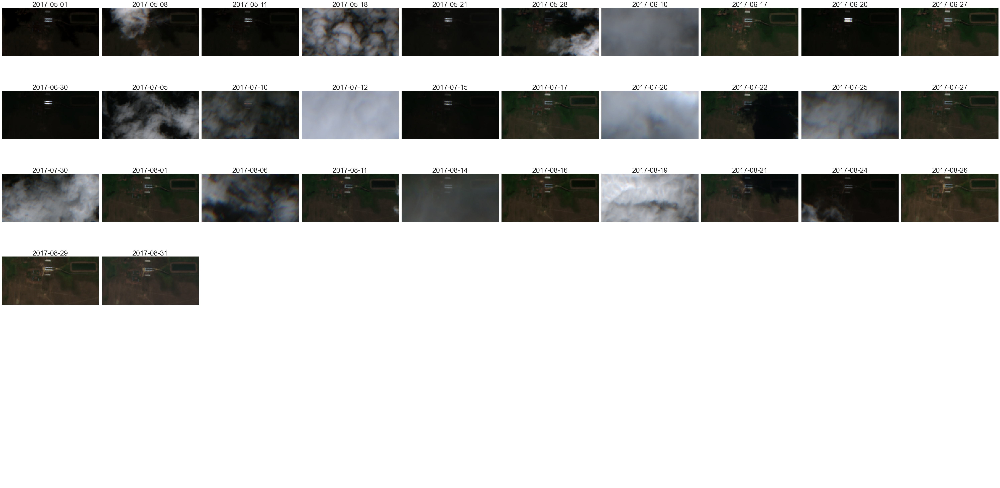

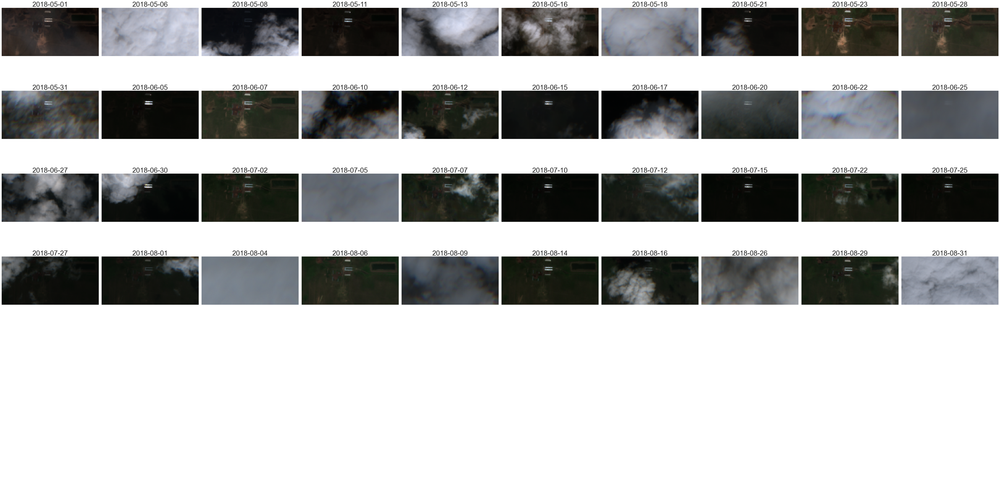

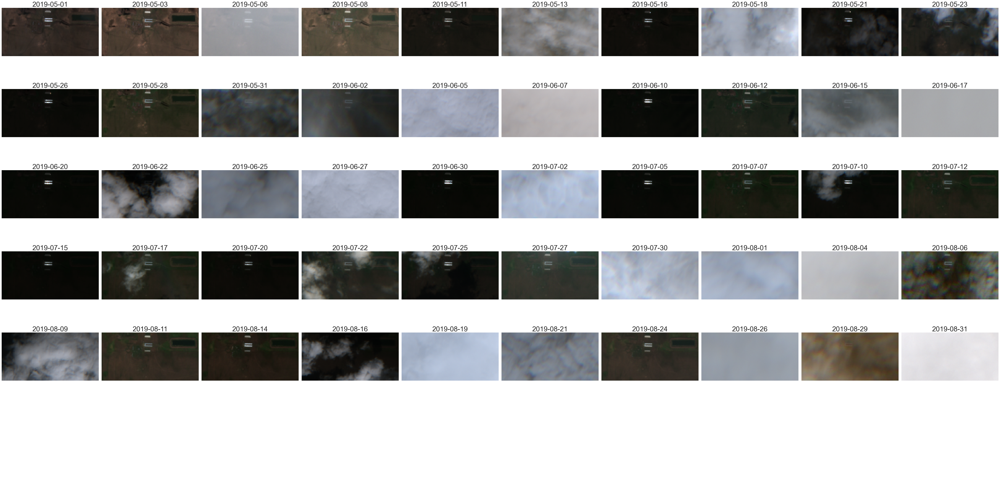

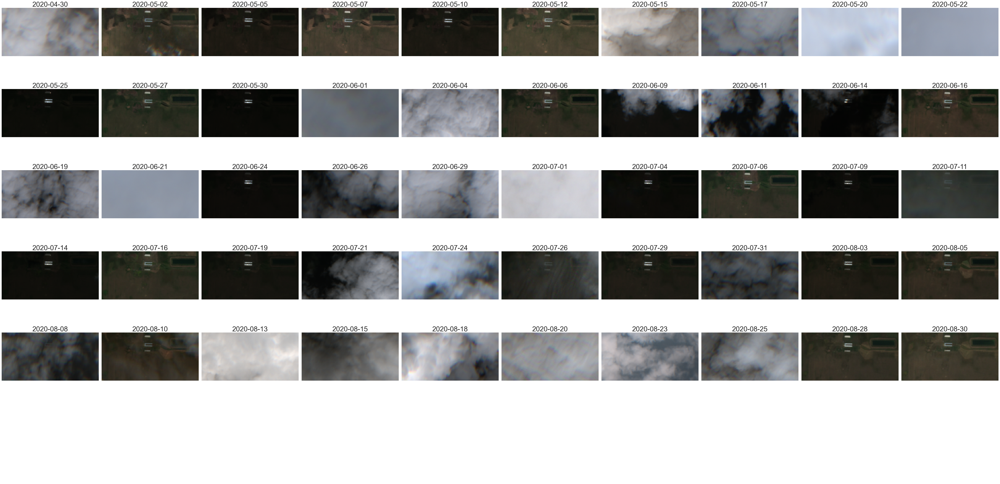

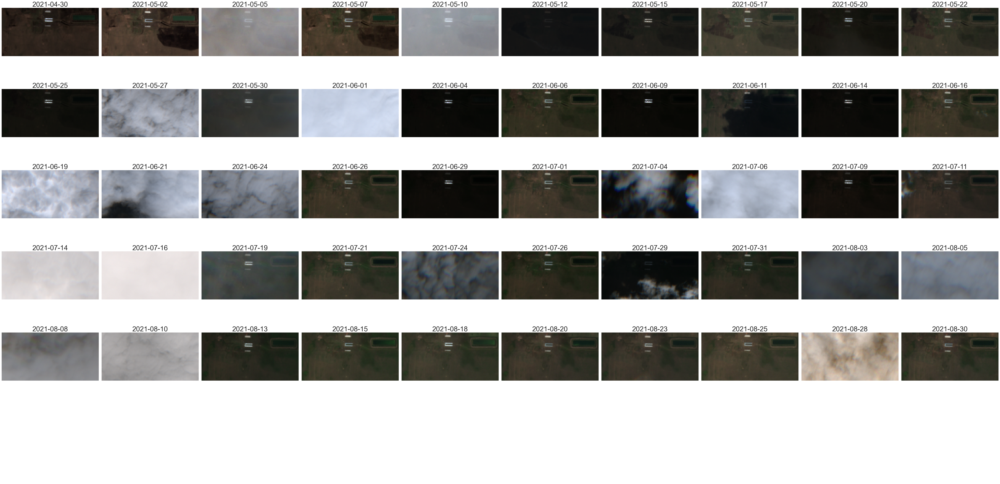

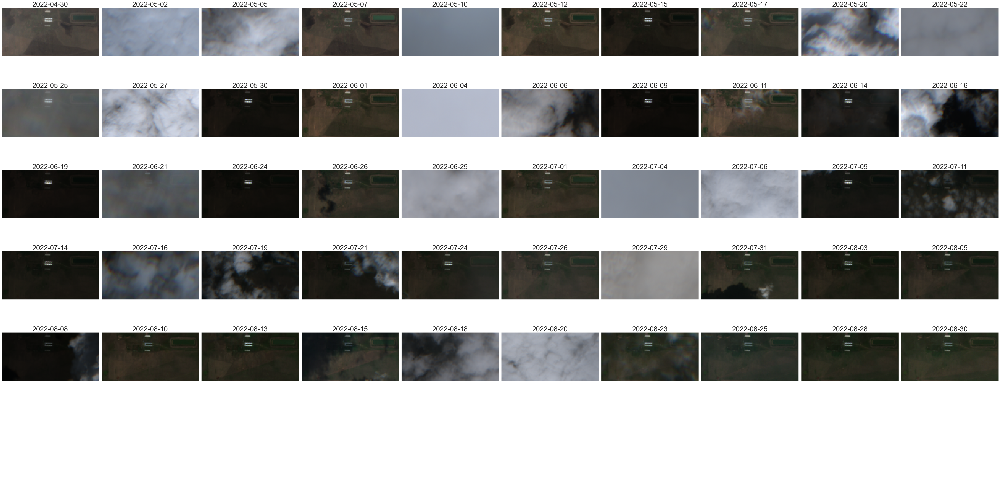

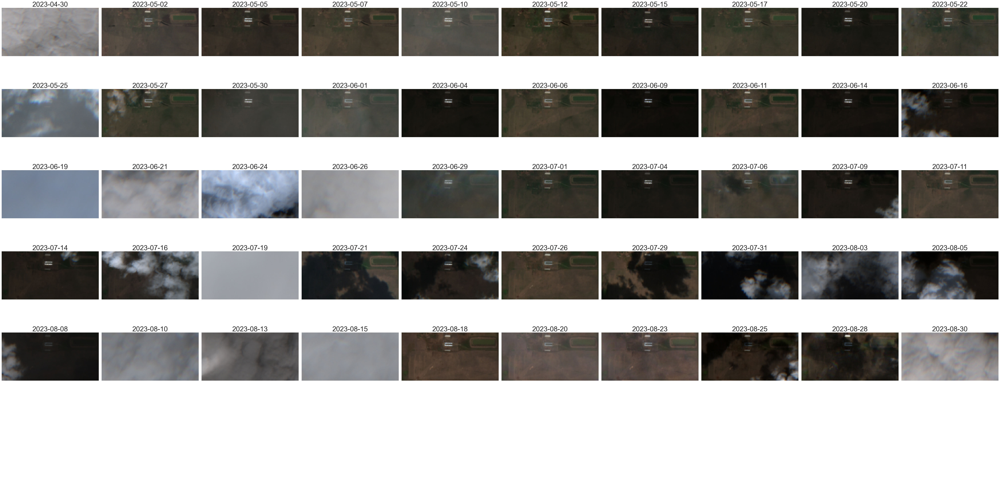

In [19]:
yearly_clear_date_dicts = []

for all_bands_data, unique_acquisitions, year_label in zip(several_years_bands_data, unique_dates_data, header_labels):
    
    cols = 10
    ncols, nrows = cols, ceil(len(results)/cols) 

    fig, axis = plt.subplots(
        ncols=ncols, nrows=nrows, figsize=(60, 30), subplot_kw={"xticks": [], "yticks": [], "frame_on": False}
    )

    idx = 0
    clear_date_dict = []
    for i, (image, timestamp) in enumerate(zip(all_bands_data, unique_acquisitions)):

        data = image.astype(np.float64) / image.max()
        data = 255 * data
        image = data.astype(np.uint8)

#         mx1 = ma.masked_array(image[:,:,bands_dict["B02"]], mask=combined_mask.reshape(aoi_height, aoi_width))
#         mx2 = ma.masked_array(image[:,:,bands_dict["B03"]], mask=combined_mask.reshape(aoi_height, aoi_width))
#         mx3 = ma.masked_array(image[:,:,bands_dict["B04"]], mask=combined_mask.reshape(aoi_height, aoi_width))
#         comb = mx1&mx2&mx3
#         white_image = comb >= white_noise_threshold
#         if white_image.sum() <= white_noise_count:
        clear_date_dict.append((str(timestamp.date().isoformat()), i))
        ax = axis[idx // ncols][idx % ncols]
        image = np.stack([image[:,:,bands_dict["B04"]], image[:,:,bands_dict["B03"]], image[:,:,bands_dict["B02"]]])
        ax.imshow(np.transpose(image, (1, 2, 0)))
        ax.set_title(timestamp.date().isoformat(), fontsize=30)
        idx += 1

    clear_date_dict = dict(clear_date_dict)
    yearly_clear_date_dicts.append(clear_date_dict)
    plt.tight_layout()
    plt.savefig(f'С {year_label[0]} по {year_label[1]}.png')

# Анализ погодных параметров и каналов

## Координаты пастбища

In [110]:
longitude = pasture_bbox.geometry.centroid.coords.xy[0][0]
latitude = pasture_bbox.geometry.centroid.coords.xy[1][0]

In [111]:
forecast_parameters = [
"temperature_2m_max",
"temperature_2m_min",
"apparent_temperature_max",
"apparent_temperature_min",
"precipitation_sum",
"rain_sum",
"showers_sum",
"snowfall_sum",
"precipitation_hours",
"precipitation_probability_max",
"precipitation_probability_min",
"precipitation_probability_mean",
"weathercode",
"sunrise",
"sunset",
"windspeed_10m_max",
"windgusts_10m_max",
"winddirection_10m_dominant",
"shortwave_radiation_sum",
"et0_fao_evapotranspiration",
"uv_index_max",
"uv_index_clear_sky_max",]

history_parameters = [
"temperature_2m_max",
"temperature_2m_min",
"apparent_temperature_max",
"apparent_temperature_min",
"precipitation_sum",
"rain_sum",
"snowfall_sum",
"precipitation_hours",
"weathercode",
"sunrise",
"sunset",
"windspeed_10m_max",
"windgusts_10m_max",
"winddirection_10m_dominant",
"shortwave_radiation_sum",
"et0_fao_evapotranspiration",]


last_main_description = ""

def get_weather_mapping():
    global last_main_description
    
    url = "https://www.nodc.noaa.gov/archive/arc0021/0002199/1.1/data/0-data/HTML/WMO-CODE/WMO4677.HTM"
    response = requests.get(url)
    soup = BeautifulSoup(response.text, 'html.parser')

    weather_mapping = {}
    
    for i_table, table in enumerate(soup.select('table[BORDER]')):
        for i_row, row in enumerate(table.find_all('tr')[1:]):
            code_and_description = row.find_all('td')[:2]
            code = int(code_and_description[0].text.strip())
            description = code_and_description[1].text.strip()
            if not description.startswith("-"):
                last_main_description = description
            else:
                description = last_main_description
            weather_mapping[code] = description
            
            
    return weather_mapping

def weather_code_to_string(wmo_code):
    return weather_mapping.get(wmo_code, "Unknown Weather Code")

# Generate the weather mapping
weather_mapping = get_weather_mapping()


def apply_params_to_URL(URL, parameters):
    URL += "&daily="
    for i, parameter in enumerate(parameters):
        if i < len(parameters) - 1:
            URL += parameter + ","
        else:
            URL += parameter
    URL += "&timezone=auto"
    
    print("URL updated: ", URL)
    return URL

def make_API_request(URL):
    try:
        # Convert from bytes to text
        resp_text = urllib.request.urlopen(URL).read().decode('UTF-8')
        # Use loads to decode from text
        json_obj = json.loads(resp_text)
        print("Successfull API request!")
        return json_obj
    except urllib.error.HTTPError  as e:
        ErrorInfo= e.read().decode()
        print('Error code: ', e.code, ErrorInfo)
        sys.exit()
    except  urllib.error.URLError as e:
        ErrorInfo= e.read().decode()
        print('Error code: ', e.code,ErrorInfo)
        sys.exit()

# История погоды по заданному диапазону

In [112]:
# dates_to_analyze = [key for year in yearly_clear_date_dicts for key in year.keys()]
dates_to_analyze = [

    '2017-06-17',
    '2017-06-27',
    '2017-07-17',
    '2017-07-27',
    '2017-08-01',
    '2017-08-11',
    '2017-08-16',
    '2017-08-26',
    '2017-08-29',
    '2017-08-31',

    '2018-05-23',
    '2018-05-28',
    '2018-06-07',
    '2018-07-02',
    '2018-08-06',
    '2018-08-14',

    '2019-05-01',
    '2019-05-03',
    '2019-05-08',
    '2019-05-28',
    '2019-06-12',
    '2019-07-07',
    '2019-07-12',
    '2019-07-27',
    '2019-08-11',
    '2019-08-14',
    '2019-08-24',

    '2020-05-07',
    '2020-05-12',
    '2020-05-27',
    '2020-06-06',
    '2020-06-16',
    '2020-07-06',
    '2020-07-16',
    '2020-07-29',
    '2020-08-03',
    '2020-08-05',
    '2020-08-28',
    '2020-08-30',

    '2021-05-02',
    '2021-05-07',
    '2021-05-15',
    '2021-05-17',
    '2021-05-22',
    '2021-06-06',
    '2021-06-16',
    '2021-06-26',
    '2021-07-01',
    '2021-07-21',
    '2021-07-26',
    '2021-07-31',
    '2021-08-13',
    '2021-08-15',
    '2021-08-18',
    '2021-08-20',
    '2021-08-23',
    '2021-08-25',
    '2021-08-30',

    '2022-05-07',
    '2022-05-12',
    '2022-06-01',
    '2022-07-01',
    '2022-07-26',
    '2022-08-03',
    '2022-08-05',
    '2022-08-10',
    '2022-08-13',
    '2022-08-25',
    '2022-08-28',
    '2022-08-30',

    '2023-05-02',
    '2023-05-05',
    '2023-05-07',
    '2023-05-12',
    '2023-05-17',
    '2023-05-22',
    '2023-06-06',
    '2023-06-11',
    '2023-07-01',
    '2023-07-11',
    '2023-07-26',
    '2023-08-18',
    '2023-08-20',
    '2023-08-23',]


month = 8
year = 2023

dates_to_analyze = filter_dates_by_year_month(dates_to_analyze, month)

In [113]:
start_date = dates_to_analyze[0] 
end_date = dates_to_analyze[-1]

In [114]:
Hist_URL = f"https://archive-api.open-meteo.com/v1/archive?latitude={latitude}&longitude={longitude}&start_date={start_date}&end_date={end_date}"

In [115]:
Hist_URL = apply_params_to_URL(Hist_URL, history_parameters)

URL updated:  https://archive-api.open-meteo.com/v1/archive?latitude=54.21495200000001&longitude=69.52020049999999&start_date=2017-08-01&end_date=2023-08-23&daily=temperature_2m_max,temperature_2m_min,apparent_temperature_max,apparent_temperature_min,precipitation_sum,rain_sum,snowfall_sum,precipitation_hours,weathercode,sunrise,sunset,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,shortwave_radiation_sum,et0_fao_evapotranspiration&timezone=auto


In [116]:
history_json_obj = make_API_request(Hist_URL)

Successfull API request!


In [117]:
history_df = pd.DataFrame(history_json_obj["daily"])

In [118]:
history_df

,time,temperature_2m_max,temperature_2m_min,apparent_temperature_max,apparent_temperature_min,precipitation_sum,rain_sum,snowfall_sum,precipitation_hours,weathercode,sunrise,sunset,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,shortwave_radiation_sum,et0_fao_evapotranspiration
0,2017-08-01,27.2,13.9,28.1,13.5,0.0,0.0,0.0,0.0,0,2017-08-01T05:34,2017-08-01T21:21,11.8,18.7,151,25.83,5.13
1,2017-08-02,29.8,18.7,29.3,17.4,0.0,0.0,0.0,0.0,2,2017-08-02T05:36,2017-08-02T21:19,17.3,40.0,175,17.52,4.99
2,2017-08-03,32.5,20.1,32.5,21.1,0.6,0.6,0.0,1.0,53,2017-08-03T05:38,2017-08-03T21:18,17.6,33.8,197,22.75,5.57
3,2017-08-04,20.6,15.7,21.4,14.6,0.0,0.0,0.0,0.0,3,2017-08-04T05:39,2017-08-04T21:16,17.7,36.4,283,8.02,1.88
4,2017-08-05,26.5,16.2,25.9,15.6,0.1,0.1,0.0,1.0,51,2017-08-05T05:41,2017-08-05T21:14,10.6,26.3,247,18.40,3.96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2209,2023-08-19,30.9,17.0,29.1,15.2,0.1,0.1,0.0,1.0,51,2023-08-19T06:05,2023-08-19T20:45,17.6,36.0,272,21.24,5.80
2210,2023-08-20,22.9,17.0,22.1,15.2,0.0,0.0,0.0,0.0,3,2023-08-20T06:07,2023-08-20T20:43,14.3,30.2,7,21.02,4.32
2211,2023-08-21,26.6,12.6,24.4,11.0,0.0,0.0,0.0,0.0,2,2023-08-21T06:09,2023-08-21T20:40,11.6,26.6,142,19.64,4.46
2212,2023-08-22,22.7,16.9,20.8,15.7,0.8,0.8,0.0,4.0,51,2023-08-22T06:11,2023-08-22T20:38,19.9,39.2,282,17.22,3.78


In [119]:
history_fraction_df = history_df[history_df['time'].isin(dates_to_analyze)]
history_fraction_df.reset_index(drop=True, inplace=True)
history_fraction_df.drop(columns=["weathercode", "sunrise", "sunset"], inplace=True)

C:\Users\Пользователь\AppData\Local\Temp\ipykernel_18088\3768268104.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  history_fraction_df.drop(columns=["weathercode", "sunrise", "sunset"], inplace=True)


In [120]:
history_fraction_df

,time,temperature_2m_max,temperature_2m_min,apparent_temperature_max,apparent_temperature_min,precipitation_sum,rain_sum,snowfall_sum,precipitation_hours,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,shortwave_radiation_sum,et0_fao_evapotranspiration
0,2017-08-01,27.2,13.9,28.1,13.5,0.0,0.0,0.0,0.0,11.8,18.7,151,25.83,5.13
1,2017-08-11,15.8,9.5,11.4,6.5,0.0,0.0,0.0,0.0,19.4,40.0,341,13.83,3.12
2,2017-08-16,23.9,11.0,23.1,9.4,0.0,0.0,0.0,0.0,8.3,16.9,79,22.83,4.13
3,2017-08-26,29.2,15.7,28.9,16.1,0.0,0.0,0.0,0.0,9.6,20.2,108,20.38,4.42
4,2017-08-29,24.2,16.5,22.6,16.6,0.0,0.0,0.0,0.0,15.4,34.9,310,17.40,3.84
5,2017-08-31,24.2,16.5,24.3,15.8,1.3,1.3,0.0,3.0,10.8,30.2,38,14.32,3.14
6,2018-08-06,26.8,13.9,25.9,11.1,0.0,0.0,0.0,0.0,18.2,36.4,116,24.06,5.36
7,2018-08-14,29.1,14.9,28.9,14.0,0.0,0.0,0.0,0.0,13.7,29.5,171,22.44,4.86
8,2019-08-11,30.4,17.1,31.9,16.7,0.0,0.0,0.0,0.0,12.6,19.1,184,22.62,4.91
9,2019-08-14,24.9,15.5,25.5,14.8,5.0,5.0,0.0,6.0,9.7,23.8,58,19.93,3.92


# Дополнительная вспомогательная функция для сбора данных ДЗЗ

In [121]:
def get_date_data(date_chosen, collection, by_pasture=True, median=False):
    global bands_dict

    if collection == "L1C":
        data_collection = DataCollection.SENTINEL2_L1C
    elif collection == "L2A":
        data_collection = DataCollection.SENTINEL2_L2A

    bands_dict = dict([(band.name, i) for i, band in enumerate(data_collection.bands)])
    aux_data_dict = dict([(band, i) for i, band in enumerate(["sunZenithAngles","sunAzimuthAngles","viewZenithMean","viewAzimuthMean"])])

    evalscript_all_bands = """
        //VERSION=3
        function setup() {{
            return {{
                input: [{{
                    bands: [{BANDS}],
                    units: "DN"
                }}],
                output: {{
                    bands: {COUNT},
                    sampleType: "FLOAT32"
                }}
            }};
        }}

        function evaluatePixel(sample) {{
            return [{SAMPLE}];
        }}
    """
    template1 = ""; template2 = ""
    for band in bands_dict.keys():
        template1 += f'"{band}", ';
        template2 += f'sample.{band}, ';
    settings = {"BANDS": template1, "SAMPLE": template2, "COUNT": str(len(bands_dict))}
    evalscript_all_bands = evalscript_all_bands.format(**settings)


    evalscript_aux_data = """
        //VERSION=3

        function setup() {{
            return {{
                input: [{{
                    bands: [{BANDS}],
                    units: "DEGREES"
                }}],
                output: {{
                    bands: {COUNT},
                    sampleType: "FLOAT32"
                }}
            }};
        }}

        function evaluatePixel(sample) {{
            return [{SAMPLE}];
        }}
    """
    template1 = ""; template2 = ""
    for band in aux_data_dict.keys():
        template1 += f'"{band}", ';
        template2 += f'sample.{band}, ';
    settings = {"BANDS": template1, "SAMPLE": template2, "COUNT": str(len(aux_data_dict))}
    evalscript_aux_data = evalscript_aux_data.format(**settings)


    time_interval = date_chosen, date_chosen

    search_iterator = catalog.search(
        data_collection,
        bbox=pasture_bbox,
        time=time_interval,
        filter="eo:cloud_cover <= 100",
        fields={"include": ["id", "properties.datetime", "properties.eo:cloud_cover"], "exclude": []},
    )

    results = list(search_iterator)

    time_difference = datetime.timedelta(hours=1)
    all_timestamps = search_iterator.get_timestamps()
    unique_acquisitions = filter_times(all_timestamps, time_difference)


    all_bands_process_requests = []

    for timestamp in unique_acquisitions:
        request = SentinelHubRequest(
            evalscript=evalscript_all_bands,
            input_data=[
                SentinelHubRequest.input_data(
                    data_collection=data_collection,
                    time_interval=(timestamp - time_difference, timestamp + time_difference),
                )
            ],
            responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
            bbox=pasture_bbox,
            size=pasture_size,
            config=config,
        )
        all_bands_process_requests.append(request)

    aux_data_process_requests = []

    for timestamp in unique_acquisitions:
        request = SentinelHubRequest(
            evalscript=evalscript_aux_data,
            input_data=[
                SentinelHubRequest.input_data(
                    data_collection=data_collection,
                    time_interval=(timestamp - time_difference, timestamp + time_difference),
                )
            ],
            responses=[SentinelHubRequest.output_response("default", MimeType.TIFF)],
            bbox=pasture_bbox,
            size=pasture_size,
            config=config,
        )
        aux_data_process_requests.append(request)

    client = SentinelHubDownloadClient(config=config)
    all_bands_download_requests = [request.download_list[0] for request in all_bands_process_requests]
    all_bands_data = client.download(all_bands_download_requests)

    client = SentinelHubDownloadClient(config=config)
    aux_data_download_requests = [request.download_list[0] for request in aux_data_process_requests]
    aux_data = client.download(aux_data_download_requests)

    white_noise_threshold = 255 # Значение [0-255]
    white_noise_count = 12246 # Количество 157*78=[0-12246]

    clear_date_dict = []
    for i, (image, timestamp) in enumerate(zip(all_bands_data, unique_acquisitions)):

        data = image.astype(np.float64) / image.max()
        data = 255 * data
        image = data.astype(np.uint8)

        mx1 = ma.masked_array(image[:,:,bands_dict["B02"]], mask=combined_mask.reshape(aoi_height, aoi_width))
        mx2 = ma.masked_array(image[:,:,bands_dict["B03"]], mask=combined_mask.reshape(aoi_height, aoi_width))
        mx3 = ma.masked_array(image[:,:,bands_dict["B04"]], mask=combined_mask.reshape(aoi_height, aoi_width))
        comb = mx1&mx2&mx3
        white_image = comb >= white_noise_threshold
        if white_image.sum() <= white_noise_count:
            clear_date_dict.append((str(timestamp.date().isoformat()), i))

    clear_date_dict = dict(clear_date_dict)
    image_date = clear_date_dict[date_chosen]

    SAA = (aux_data[image_date][:, :, aux_data_dict["sunAzimuthAngles"]]).mean()
    SZA = (aux_data[image_date][:, :, aux_data_dict["sunZenithAngles"]]).mean()
    VAM = (aux_data[image_date][:, :, aux_data_dict["viewAzimuthMean"]]).mean()
    VZM = (aux_data[image_date][:, :, aux_data_dict["viewZenithMean"]]).mean()

    if by_pasture:
        # Нормализированные по пастбищу
        ULTRA_BLUE = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B01"]])))

        BLUE = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B02"]])))
        GREEN = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B03"]])))
        RED = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B04"]])))

        RED_EDGE1 = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B05"]])))
        RED_EDGE2 = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B06"]])))
        RED_EDGE3 = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B07"]])))

        NIR = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B08"]])))
        N_NIR = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B8A"]])))
        WV = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B09"]])))
        if "B10" in bands_dict:
            SWIR_C = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B10"]])))
        SWIR2 = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B11"]])))
        SWIR3 = normalize(brighten(get_only_pasture(all_bands_data[image_date][:, :, bands_dict["B12"]])))

    else:
        # НЕ Нормализированные по пастбищу
        ULTRA_BLUE = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B01"]])))

        BLUE = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B02"]])))
        GREEN = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B03"]])))
        RED = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B04"]])))

        RED_EDGE1 = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B05"]])))
        RED_EDGE2 = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B06"]])))
        RED_EDGE3 = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B07"]])))

        NIR = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B08"]])))
        N_NIR = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B8A"]])))
        WV = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B09"]])))
        if "B10" in bands_dict:
            SWIR_C = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B10"]])))
        SWIR2 = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B11"]])))
        SWIR3 = get_only_pasture(normalize(brighten(all_bands_data[image_date][:, :, bands_dict["B12"]])))

    ndvi = (NIR - RED) / (NIR + RED)
    savi = (NIR - RED) / (NIR + RED + 0.5) * (1 + 0.5)
    revi = (NIR / RED_EDGE1) - 1
    evi = 2.5 * (NIR - RED) / (NIR + 6 * RED - 7.5 * BLUE + 1)
    tvi = np.sqrt((NIR - RED) / (NIR + RED) + 0.0)
    gndvi = (NIR - GREEN) / (NIR + GREEN)
    ndii = (NIR - SWIR3) / (NIR + SWIR3)
    cvi = (NIR / RED) - 1
    gci = (NIR / GREEN) - 1
    pri = (RED_EDGE1 - RED) / (RED_EDGE1 + RED)
    ndre = (NIR - RED_EDGE1) / (NIR + RED_EDGE1)
    osavi = (NIR - RED) / (NIR + RED + 0.16)
    arvi = (NIR - (2 * RED) + BLUE) / (NIR + (2 * RED) + BLUE)
    vari = (RED+BLUE-GREEN)
    my_index = (GREEN-RED)+(NIR-SWIR3)



    print(f"Успешно получены каналы для даты: {date_chosen}")
    if median:
        if "B10" in bands_dict:
            return ["time"] + list(bands_dict.keys()) + ["ndvi", "savi", "revi", "evi", "tvi", "gndvi", "ndii", "cvi", "gci", "pri", "ndre", "osavi", "arvi", "vari", "my_index",] + list(aux_data_dict.keys()), [date_chosen, ma.median(ULTRA_BLUE), ma.median(BLUE), ma.median(GREEN), ma.median(RED), ma.median(RED_EDGE1), ma.median(RED_EDGE2), ma.median(RED_EDGE3), ma.median(NIR), ma.median(N_NIR), ma.median(WV), ma.median(SWIR_C), ma.median(SWIR2), ma.median(SWIR3), ma.median(ndvi), ma.median(savi), ma.median(revi), ma.median(evi), ma.median(tvi), ma.median(gndvi), ma.median(ndii), ma.median(cvi), ma.median(gci), ma.median(pri), ma.median(ndre), ma.median(osavi), ma.median(arvi), ma.median(vari), ma.median(my_index), SZA, SAA, VZM, VAM]
        else:
            return ["time"] + list(bands_dict.keys()) + ["ndvi", "savi", "revi", "evi", "tvi", "gndvi", "ndii", "cvi", "gci", "pri", "ndre", "osavi", "arvi", "vari", "my_index",] + list(aux_data_dict.keys()), [date_chosen, ma.median(ULTRA_BLUE), ma.median(BLUE), ma.median(GREEN), ma.median(RED), ma.median(RED_EDGE1), ma.median(RED_EDGE2), ma.median(RED_EDGE3), ma.median(NIR), ma.median(N_NIR), ma.median(WV), ma.median(SWIR2), ma.median(SWIR3), ma.median(ndvi), ma.median(savi), ma.median(revi), ma.median(evi), ma.median(tvi), ma.median(gndvi), ma.median(ndii), ma.median(cvi), ma.median(gci), ma.median(pri), ma.median(ndre), ma.median(osavi), ma.median(arvi), ma.median(vari), ma.median(my_index), SZA, SAA, VZM, VAM]
    else:
        if "B10" in bands_dict:
            return ["time"] + list(bands_dict.keys()) + ["ndvi", "savi", "revi", "evi", "tvi", "gndvi", "ndii", "cvi", "gci", "pri", "ndre", "osavi", "arvi", "vari", "my_index",] + list(aux_data_dict.keys()), [date_chosen, ma.mean(ULTRA_BLUE), ma.mean(BLUE), ma.mean(GREEN), ma.mean(RED), ma.mean(RED_EDGE1), ma.mean(RED_EDGE2), ma.mean(RED_EDGE3), ma.mean(NIR), ma.mean(N_NIR), ma.mean(WV), ma.mean(SWIR_C), ma.mean(SWIR2), ma.mean(SWIR3), ma.mean(ndvi), ma.mean(savi), ma.mean(revi), ma.mean(evi), ma.mean(tvi), ma.mean(gndvi), ma.mean(ndii), ma.mean(cvi), ma.mean(gci), ma.mean(pri), ma.mean(ndre), ma.mean(osavi), ma.mean(arvi), ma.mean(vari), ma.mean(my_index), SZA, SAA, VZM, VAM]
        else:
            return ["time"] + list(bands_dict.keys()) + ["ndvi", "savi", "revi", "evi", "tvi", "gndvi", "ndii", "cvi", "gci", "pri", "ndre", "osavi", "arvi", "vari", "my_index",] + list(aux_data_dict.keys()), [date_chosen, ma.mean(ULTRA_BLUE), ma.mean(BLUE), ma.mean(GREEN), ma.mean(RED), ma.mean(RED_EDGE1), ma.mean(RED_EDGE2), ma.mean(RED_EDGE3), ma.mean(NIR), ma.mean(N_NIR), ma.mean(WV), ma.mean(SWIR2), ma.mean(SWIR3), ma.mean(ndvi), ma.mean(savi), ma.mean(revi), ma.mean(evi), ma.mean(tvi), ma.mean(gndvi), ma.mean(ndii), ma.mean(cvi), ma.mean(gci), ma.mean(pri), ma.mean(ndre), ma.mean(osavi), ma.mean(arvi), ma.mean(vari), ma.mean(my_index), SZA, SAA, VZM, VAM]

# Получение данных ДЗЗ по доступным датам

In [122]:
sample_form = []
for date in dates_to_analyze:
    data_lables, data_list = get_date_data(date, "L2A", by_pasture=False, median=False)
    sample_form.append(data_list)    

Успешно получены каналы для даты: 2017-08-01
Успешно получены каналы для даты: 2017-08-11
Успешно получены каналы для даты: 2017-08-16
Успешно получены каналы для даты: 2017-08-26
Успешно получены каналы для даты: 2017-08-29
Успешно получены каналы для даты: 2017-08-31
Успешно получены каналы для даты: 2018-08-06
Успешно получены каналы для даты: 2018-08-14
Успешно получены каналы для даты: 2019-08-11
Успешно получены каналы для даты: 2019-08-14
Успешно получены каналы для даты: 2019-08-24
Успешно получены каналы для даты: 2020-08-03
Успешно получены каналы для даты: 2020-08-05
Успешно получены каналы для даты: 2020-08-28
Успешно получены каналы для даты: 2020-08-30
Успешно получены каналы для даты: 2021-08-13
Успешно получены каналы для даты: 2021-08-15
Успешно получены каналы для даты: 2021-08-18
Успешно получены каналы для даты: 2021-08-20
Успешно получены каналы для даты: 2021-08-23
Успешно получены каналы для даты: 2021-08-25
Успешно получены каналы для даты: 2021-08-30
Успешно по

C:\Users\Пользователь\AppData\Local\Temp\ipykernel_18088\1594915382.py:198: RuntimeWarning: invalid value encountered in sqrt
  tvi = np.sqrt((NIR - RED) / (NIR + RED) + 0.0)


In [123]:
indices_df = pd.DataFrame(sample_form, columns=data_lables)
# indices_df = indices_df[indices_df != "--"].dropna()
indices_df

,time,B01,B02,B03,B04,B05,B06,B07,B08,B8A,...,pri,ndre,osavi,arvi,vari,my_index,sunZenithAngles,sunAzimuthAngles,viewZenithMean,viewAzimuthMean
0,2017-08-01,0.224226,0.179637,0.264385,0.314703,0.573983,0.921229,0.973539,0.992763,0.998585,...,0.325369,0.269934,0.473104,0.333120,0.229954,0.073456,37.769295,158.625992,7.778082,116.019760
1,2017-08-11,0.180944,0.196393,0.287336,0.324350,0.587938,0.933212,0.977969,0.997998,0.999659,...,0.319624,0.261713,0.466055,0.326617,0.233408,0.083159,40.404793,159.985992,7.777366,116.034538
2,2017-08-16,0.263348,0.193871,0.263204,0.341222,0.579065,0.883047,0.944749,0.975935,0.991714,...,0.282755,0.256852,0.438003,0.287273,0.271890,0.021618,41.861202,160.811020,7.766488,115.218010
3,2017-08-26,0.219519,0.197248,0.255914,0.395258,0.650843,0.904612,0.962477,0.984374,0.998918,...,0.264506,0.207360,0.392171,0.221694,0.336592,-0.070874,45.022701,162.574982,7.753326,115.238060
4,2017-08-29,0.161545,0.202002,0.252087,0.375023,0.624190,0.887539,0.955476,0.979750,0.999132,...,0.268479,0.225347,0.408010,0.245396,0.324937,-0.057707,45.646904,166.519012,5.215286,272.907684
5,2017-08-31,0.236748,0.186948,0.256583,0.393229,0.657985,0.928014,0.985316,0.997126,0.999921,...,0.269365,0.209593,0.398772,0.223626,0.323594,-0.080713,46.710506,163.472992,7.789610,116.008636
6,2018-08-06,0.176397,0.132067,0.223856,0.249327,0.527956,0.967678,0.997481,0.998952,0.999776,...,0.372420,0.310840,0.536852,0.402199,0.157537,0.144002,38.975594,159.206024,7.854567,115.914543
7,2018-08-14,0.096334,0.203992,0.232747,0.224179,0.529365,0.966326,0.997233,0.998052,0.999426,...,0.419229,0.309132,0.564183,0.469560,0.195425,0.257984,40.756493,164.042984,5.175909,272.689423
8,2019-08-11,0.250795,0.169746,0.236591,0.365255,0.577857,0.829630,0.917330,0.946551,0.989146,...,0.229096,0.243094,0.396633,0.213908,0.298410,-0.120664,40.262699,159.954010,7.809456,116.011475
9,2019-08-14,0.101675,0.160780,0.169624,0.325894,0.541356,0.781801,0.870264,0.913102,0.968444,...,0.253442,0.256771,0.421337,0.250610,0.317050,-0.134436,40.680107,164.050018,5.201482,271.564880


# Подготовка таблиц

In [124]:
joined_df = pd.merge(indices_df, history_fraction_df, on='time', how='outer')
joined_df

,time,B01,B02,B03,B04,B05,B06,B07,B08,B8A,...,apparent_temperature_min,precipitation_sum,rain_sum,snowfall_sum,precipitation_hours,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,shortwave_radiation_sum,et0_fao_evapotranspiration
0,2017-08-01,0.224226,0.179637,0.264385,0.314703,0.573983,0.921229,0.973539,0.992763,0.998585,...,13.5,0.0,0.0,0.0,0.0,11.8,18.7,151,25.83,5.13
1,2017-08-11,0.180944,0.196393,0.287336,0.324350,0.587938,0.933212,0.977969,0.997998,0.999659,...,6.5,0.0,0.0,0.0,0.0,19.4,40.0,341,13.83,3.12
2,2017-08-16,0.263348,0.193871,0.263204,0.341222,0.579065,0.883047,0.944749,0.975935,0.991714,...,9.4,0.0,0.0,0.0,0.0,8.3,16.9,79,22.83,4.13
3,2017-08-26,0.219519,0.197248,0.255914,0.395258,0.650843,0.904612,0.962477,0.984374,0.998918,...,16.1,0.0,0.0,0.0,0.0,9.6,20.2,108,20.38,4.42
4,2017-08-29,0.161545,0.202002,0.252087,0.375023,0.624190,0.887539,0.955476,0.979750,0.999132,...,16.6,0.0,0.0,0.0,0.0,15.4,34.9,310,17.40,3.84
5,2017-08-31,0.236748,0.186948,0.256583,0.393229,0.657985,0.928014,0.985316,0.997126,0.999921,...,15.8,1.3,1.3,0.0,3.0,10.8,30.2,38,14.32,3.14
6,2018-08-06,0.176397,0.132067,0.223856,0.249327,0.527956,0.967678,0.997481,0.998952,0.999776,...,11.1,0.0,0.0,0.0,0.0,18.2,36.4,116,24.06,5.36
7,2018-08-14,0.096334,0.203992,0.232747,0.224179,0.529365,0.966326,0.997233,0.998052,0.999426,...,14.0,0.0,0.0,0.0,0.0,13.7,29.5,171,22.44,4.86
8,2019-08-11,0.250795,0.169746,0.236591,0.365255,0.577857,0.829630,0.917330,0.946551,0.989146,...,16.7,0.0,0.0,0.0,0.0,12.6,19.1,184,22.62,4.91
9,2019-08-14,0.101675,0.160780,0.169624,0.325894,0.541356,0.781801,0.870264,0.913102,0.968444,...,14.8,5.0,5.0,0.0,6.0,9.7,23.8,58,19.93,3.92


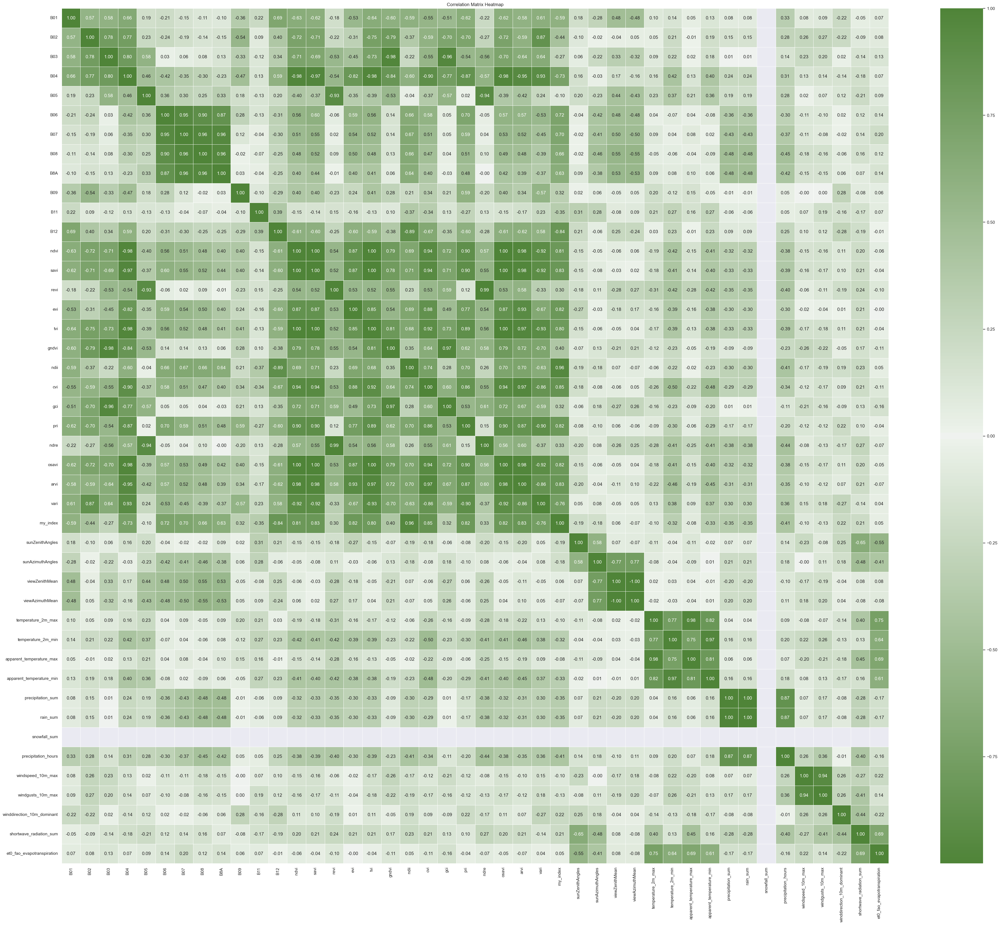

In [125]:
correlation_matrix = joined_df.corr()

# Set up the matplotlib figure
plt.figure(figsize=(48, 40))

cmap = sns.diverging_palette(120, 120, as_cmap=True)

# Plot the correlation matrix using a heatmap
sns.heatmap(correlation_matrix, annot=True, cmap=cmap, fmt=".2f", linewidths=.5)

# # Adjust the x-axis labels for better readability
# plt.xticks(rotation=45, ha="right")

# # Draw a separation line after the 5th column (index 4)
# plt.axvline(x=12, color='black', linestyle='-', linewidth=4)
# plt.axvline(x=27, color='black', linestyle='-', linewidth=4)
# plt.axvline(x=31, color='black', linestyle='-', linewidth=4)

# plt.axhline(y=12, color='black', linestyle='-', linewidth=4)
# plt.axhline(y=27, color='black', linestyle='-', linewidth=4)
# plt.axhline(y=31, color='black', linestyle='-', linewidth=4)

# x = np.arange(correlation_matrix.shape[0])
# plt.plot(x, x, color='blue', linestyle='-', linewidth=4)

# # Adjust the x-axis labels for better readability
# plt.xticks(rotation=45, ha="right")

# Show the plot
plt.title("Correlation Matrix Heatmap")
plt.show()